# Comparsion of the three instruments: 


I have got nano-SMPS data from Prof. Park, GIST, 
in the attached you may find data for 2022.

2023 year data will come as soon as the QC is done.

Please note that
Time/date : UTC
1st row : diameter
From 2nd row : dN for each channel
Time resolution : 3 minutes
dlogDp = 1/64 for all channels.

Sorry, my typo-error. It should be 64, not 60 !!

Thank for the update, in the attached you may find nano-SMPS data for 2023.
Data format is as same as 2022 case (UTC, time resolution for scan : 3 minutes, dN value in each cell, dlogDp = 1/60)
Unfortunately the data collection was not very good, we have only 21% time coverage, due to logging issue.  At the moment this problem is taken care of by colleagues whi are visiting NYA now.

As for zero data, basically nano-SMPS system is not that stable as your DMPS, as you know.  We have experienced many zero values during non-event cases.  Still the system is very reliable to detect the sub-10nm particles, and the inversion process already considered the particle loss issue.


Here, via comparing to the DMPS (ratio of DMPS to NAIS) in the overlapping size range 6–42 nm, a correction factor for the NAIS can be derived. The NAIS was found to overestimate the concentration by a factor 5, which is the factor used to correct the NAIS concertation prior to the combination of the size distributions from the three instruments (Fig. S2†). 


In [1]:
from NAIS_working_functions import *
from aerosol_functions import *

%load_ext autoreload
%autoreload 2

import glob
import pandas as pd
import os
from sklearn import datasets, linear_model
import datetime
import bnn_tools.basic_funs as bu
from matplotlib import pyplot as plt, ticker as mticker
from datetime import datetime
from dateutil.relativedelta import relativedelta

plt.rcParams["font.family"] = 'monospace'

In [2]:
current_dir = r'C:\Users\DominicHeslinRees\NAIS_work'
print(current_dir)

inpath_files = current_dir+"\\ZEP_processed_files" #processed files from Janne's script/package
outpath_plots = current_dir+"\\plots\\daily_plots"

files = glob.glob(inpath_files+'\\*.nc')
print(files[0])

C:\Users\DominicHeslinRees\NAIS_work
C:\Users\DominicHeslinRees\NAIS_work\ZEP_processed_files\NAIS_20220417.nc


In [3]:
loadpath = r'C:\Users\DominicHeslinRees\Documents\Data\nano_SMPS\ar_2022'
filename = 'ar_2022'

df_nanosmps_2022 = pd.read_csv(loadpath+'//'+filename+'.csv', sep=',', parse_dates=['date'], index_col=0)

loadpath = r'C:\Users\DominicHeslinRees\Documents\Data\nano_SMPS\ar_2023'
filename = 'ar_2023'

df_nanosmps_2023 = pd.read_csv(loadpath+'//'+filename+'.csv', sep=',', parse_dates=['date'], index_col=0)

df_nanosmps = pd.concat([df_nanosmps_2022, df_nanosmps_2023])
df_nanosmps = df_nanosmps/(1/64) #NORMALISE
df_nanosmps.index.name = 'time'

In [4]:
def convert_df_to_ds(df, bin_cols, name=None, rename='', resample=False, resolution='h'):
    print("resolution: "+str(resolution))
    df.index.name = 'time'
    df_ = df[bin_cols].copy()  #diameter is nm
    df_.columns = df_.columns.astype(float)*10**(-9)
    df_.columns.name = 'diameter'
    if resample == True:
        da = df_.stack().to_xarray().resample({'time':resolution}).mean()
    if resample == False:
        da = df_.stack().to_xarray()
    da.name=name
    ds = da.rename(rename).to_dataset()
    ds['time'] = pd.DatetimeIndex(ds['time'].values)
    ds['diameter'] = ds['diameter'].astype(float)
    return ds

In [5]:
nanosmps_bin_cols = df_nanosmps.columns
ds_nanosmps = convert_df_to_ds(df_nanosmps, nanosmps_bin_cols, 
                name=None, rename='nanosmps_number', resolution='30T')

resolution: 30T


In [6]:
ds_nanosmps

<xarray.Dataset>
Dimensions:          (time: 188001, diameter: 95)
Coordinates:
  * time             (time) datetime64[ns] 2022-01-01 ... 2023-12-31T23:57:00
  * diameter         (diameter) float64 2.02e-09 2.09e-09 ... 5.73e-08 5.94e-08
Data variables:
    nanosmps_number  (time, diameter) float64 0.0 0.0 0.0 ... 0.0 3.758e+04 0.0

In [7]:
ds_nanosmps = ds_nanosmps.rename({'diameter':'Dp'}).assign_coords({'Dp':lambda d:d['Dp'].astype(float)}).rename({'nanosmps_number':'dndlDp'}).sortby('time')
ds_nanosmps = ds_nanosmps.pipe(bu.dp_regrid, log_dy=.05, n_subs=10).pipe(bu.set_Dp)
ds_nanosmps = ds_nanosmps.to_dataset()
ds_nanosmps = ds_nanosmps.expand_dims({'id':['nanosmps']})
ds_nanosmps = ds_nanosmps.resample({'time':'30T'}).mean()

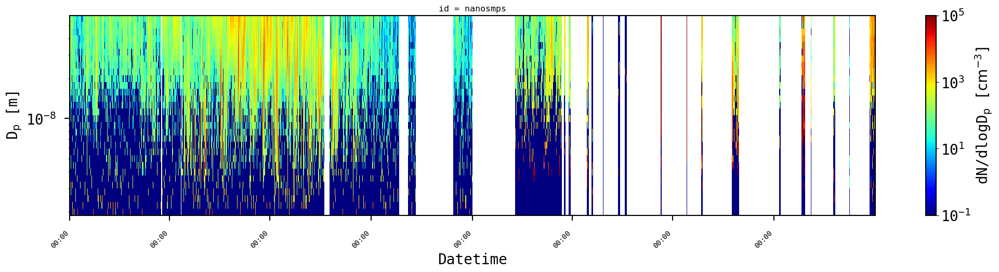

In [8]:
fig = spectral_plot(ds_nanosmps, var='dndlDp', title='', fs_label=20, 
                xlabel='Datetime', log_colour_scale=True, add_colourbar_labels=True)

In [11]:
#load the non-quality checked DMPS data
load_path = r'C:\Users\DominicHeslinRees\NAIS_work\data\dmps\2021_2024'
filename='DMPS_QC_2022_2024_30T_CF.nc'
xr_dmps_30T = xr.open_dataset(load_path+'\\'+filename)

In [12]:
ds_dmps = xr_dmps_30T.rename({'diameter':'Dp'}).assign_coords({'Dp':lambda d:d['Dp'].astype(float)}).rename({'dmps_number':'dndlDp'}).sortby('time').resample({'time':'30T'}).mean()
ds_dmps = (ds_dmps.pipe(bu.dp_regrid,log_dy=.05,n_subs=10).pipe(bu.set_Dp))

In [13]:
ds_dmps = ds_dmps.to_dataset()
ds_dmps = ds_dmps.expand_dims({'id':['dmps']})

In [14]:
ds_dmps

<xarray.Dataset>
Dimensions:  (id: 1, time: 65622, Dp: 44)
Coordinates:
  * id       (id) object 'dmps'
  * time     (time) datetime64[ns] 2021-01-01 ... 2024-09-29T02:30:00
    lDp      (Dp) float64 -8.3 -8.25 -8.2 -8.15 -8.1 ... -6.3 -6.25 -6.2 -6.15
  * Dp       (Dp) float64 5.012e-09 5.623e-09 6.31e-09 ... 6.31e-07 7.079e-07
Data variables:
    dndlDp   (id, time, Dp) float64 8.096e-29 7.626e-29 ... 1.705e-29 1.675e-29

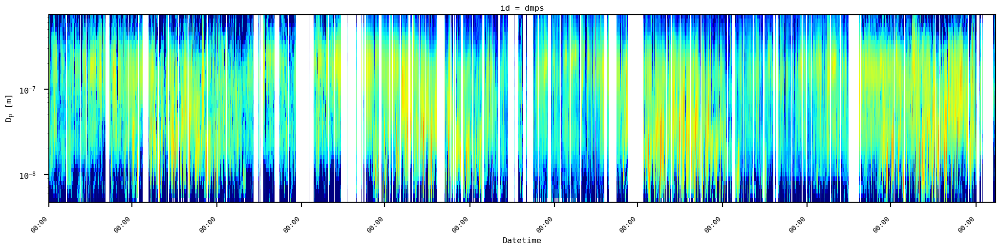

In [15]:
fig = spectral_plot(ds_dmps, var='dndlDp', title='', fs_label=12, 
                xlabel='Datetime', log_colour_scale=True, ax=None)

In [ ]:
resolution = '5T'
path = r'C:/Users/DominicHeslinRees/NAIS_work/ZEP_processed_files/resampled_removed_snow_clouds_bad_charged/'
XR_resampled = xr.open_dataset(path+'\\'+str(resolution)+'_removed_snow_clouds_bad_charged.nc')

ds_nais = XR_resampled.rename({'diameter':'Dp'}).assign_coords({'Dp':lambda d:d['Dp'].astype(float)}).rename({'neg_particles':'dndlDp'}).sortby('time').resample({'time':'30T'}).mean()
ds_nais = (ds_nais.pipe(bu.dp_regrid,log_dy=.05,n_subs=10).pipe(bu.set_Dp))

# df_nais_neg_particles = XR_resampled['neg_particles'].to_pandas() #df

# columns = df_nais_neg_particles.columns
# columns = [x*10**9 for x in columns]
# df_nais_neg_particles.columns = columns

In [17]:
ds_nais = ds_nais.to_dataset()
ds_nais = ds_nais.expand_dims({'id':['nais']})

In [18]:
ds_nais 

<xarray.Dataset>
Dimensions:  (id: 1, time: 43297, Dp: 25)
Coordinates:
  * id       (id) object 'nais'
  * time     (time) datetime64[ns] 2022-04-17 2022-04-17T00:30:00 ... 2024-10-05
    lDp      (Dp) float64 -8.6 -8.55 -8.5 -8.45 -8.4 ... -7.55 -7.5 -7.45 -7.4
  * Dp       (Dp) float64 2.512e-09 2.818e-09 3.162e-09 ... 3.548e-08 3.981e-08
Data variables:
    dndlDp   (id, time, Dp) float64 nan nan nan nan nan ... nan nan nan nan nan

In [19]:
ds_nais.isnull()

<xarray.Dataset>
Dimensions:  (id: 1, time: 43297, Dp: 25)
Coordinates:
  * id       (id) object 'nais'
  * time     (time) datetime64[ns] 2022-04-17 2022-04-17T00:30:00 ... 2024-10-05
    lDp      (Dp) float64 -8.6 -8.55 -8.5 -8.45 -8.4 ... -7.55 -7.5 -7.45 -7.4
  * Dp       (Dp) float64 2.512e-09 2.818e-09 3.162e-09 ... 3.548e-08 3.981e-08
Data variables:
    dndlDp   (id, time, Dp) bool True True True True ... True True True True

In [20]:
nais_datetimes = list(ds_nais.time.values)
nais_datetimes = [pd.to_datetime(x) for x in nais_datetimes]
# ds_dmps_valid =  ds_dmps.sel(time=nais_datetimes, drop=True)
# ds_nanosmps_valid = ds_nanosmps.sel(time=nais_datetimes, drop=True)

In [21]:
ds_dmps_valid_time = ds_dmps.where(ds_dmps.time.isin(ds_nais.time), drop=True)
ds_nanosmps_valid_time = ds_nanosmps.where(ds_nanosmps.time.isin(ds_nais.time), drop=True)

In [22]:
ds_nais.Dp

<xarray.DataArray 'Dp' (Dp: 25)>
array([2.511886e-09, 2.818383e-09, 3.162278e-09, 3.548134e-09, 3.981072e-09,
       4.466836e-09, 5.011872e-09, 5.623413e-09, 6.309573e-09, 7.079458e-09,
       7.943282e-09, 8.912509e-09, 1.000000e-08, 1.122018e-08, 1.258925e-08,
       1.412538e-08, 1.584893e-08, 1.778279e-08, 1.995262e-08, 2.238721e-08,
       2.511886e-08, 2.818383e-08, 3.162278e-08, 3.548134e-08, 3.981072e-08])
Coordinates:
    lDp      (Dp) float64 -8.6 -8.55 -8.5 -8.45 -8.4 ... -7.55 -7.5 -7.45 -7.4
  * Dp       (Dp) float64 2.512e-09 2.818e-09 3.162e-09 ... 3.548e-08 3.981e-08

In [23]:
ds_dmps_valid_time.Dp

<xarray.DataArray 'Dp' (Dp: 44)>
array([5.011872e-09, 5.623413e-09, 6.309573e-09, 7.079458e-09, 7.943282e-09,
       8.912509e-09, 1.000000e-08, 1.122018e-08, 1.258925e-08, 1.412538e-08,
       1.584893e-08, 1.778279e-08, 1.995262e-08, 2.238721e-08, 2.511886e-08,
       2.818383e-08, 3.162278e-08, 3.548134e-08, 3.981072e-08, 4.466836e-08,
       5.011872e-08, 5.623413e-08, 6.309573e-08, 7.079458e-08, 7.943282e-08,
       8.912509e-08, 1.000000e-07, 1.122018e-07, 1.258925e-07, 1.412538e-07,
       1.584893e-07, 1.778279e-07, 1.995262e-07, 2.238721e-07, 2.511886e-07,
       2.818383e-07, 3.162278e-07, 3.548134e-07, 3.981072e-07, 4.466836e-07,
       5.011872e-07, 5.623413e-07, 6.309573e-07, 7.079458e-07])
Coordinates:
    lDp      (Dp) float64 -8.3 -8.25 -8.2 -8.15 -8.1 ... -6.3 -6.25 -6.2 -6.15
  * Dp       (Dp) float64 5.012e-09 5.623e-09 6.31e-09 ... 6.31e-07 7.079e-07

In [24]:
ds_dmps_valid_time_dp = ds_dmps_valid_time.where(ds_dmps_valid_time.Dp.isin(ds_nais.Dp), drop=True)
ds_nanosmps_valid_time_dp = ds_nanosmps_valid_time.where(ds_nanosmps_valid_time.Dp.isin(ds_nais.Dp), drop=True)

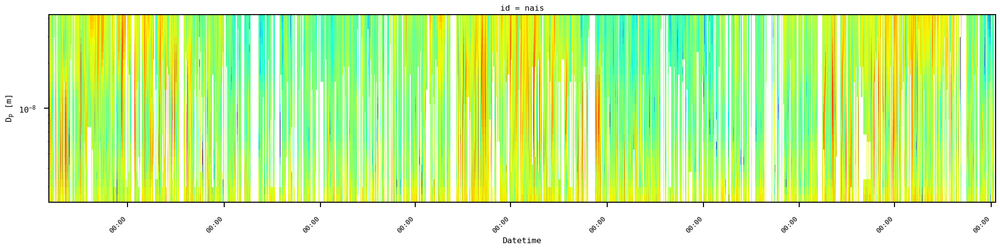

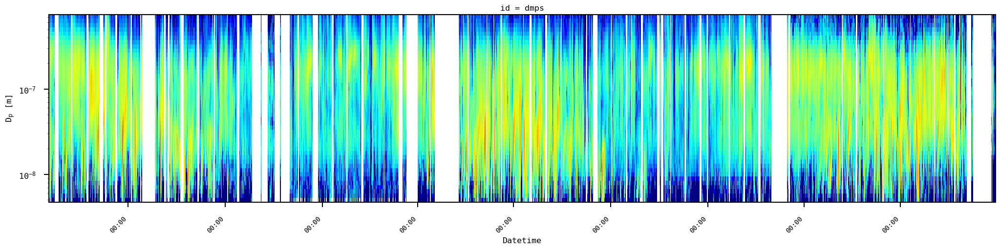

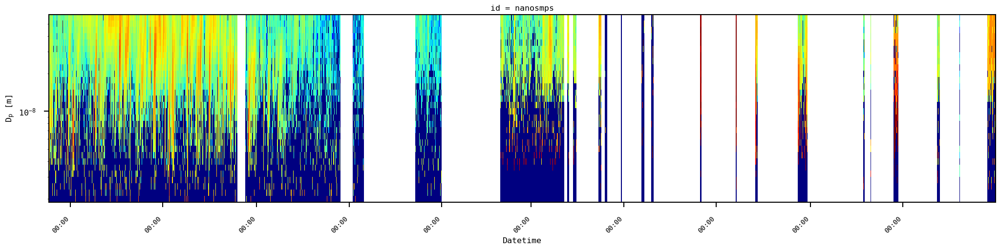

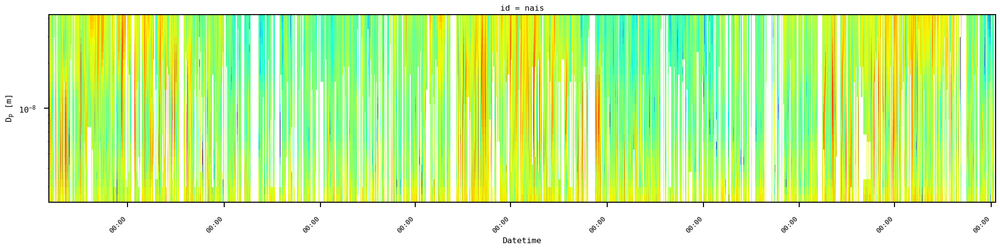

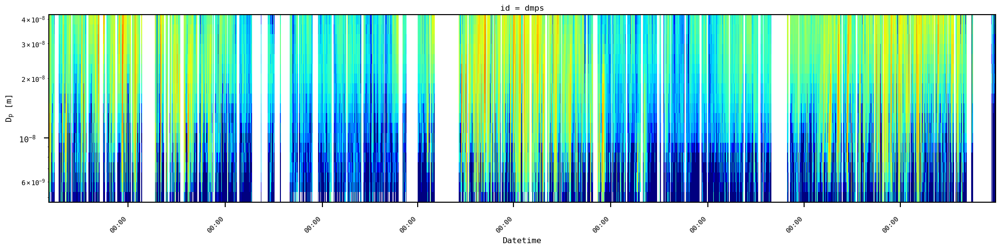

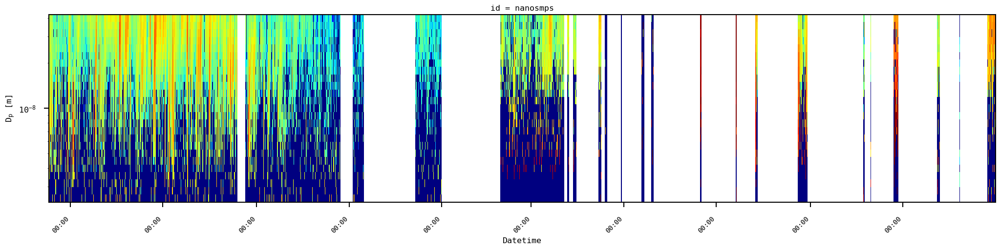

In [25]:
fig = spectral_plot(ds_nais, var='dndlDp', title='', fs_label=12, 
                xlabel='Datetime', log_colour_scale=True, ax=None)
fig = spectral_plot(ds_dmps_valid_time, var='dndlDp', title='', fs_label=12, 
                xlabel='Datetime', log_colour_scale=True, ax=None)
fig = spectral_plot(ds_nanosmps_valid_time, var='dndlDp', title='', fs_label=12, 
                xlabel='Datetime', log_colour_scale=True, ax=None)


fig = spectral_plot(ds_nais, var='dndlDp', title='', fs_label=12, 
                xlabel='Datetime', log_colour_scale=True, ax=None)
fig = spectral_plot(ds_dmps_valid_time_dp, var='dndlDp', title='', fs_label=12, 
                xlabel='Datetime', log_colour_scale=True, ax=None)
fig = spectral_plot(ds_nanosmps_valid_time_dp, var='dndlDp', title='', fs_label=12, 
                xlabel='Datetime', log_colour_scale=True, ax=None)

In [26]:
#merged = ds_nais.combine_first(ds_dmps.where(ds_nais.isnull())).combine_first(arr3.where(arr1.isnull()))

In [27]:
#merged = ds_nais.combine_first(ds_dmps).combine_first(ds_nanosmps)

In [28]:
def pnsd_size_distribution(ds, var, polarity='', diameters_ticks=None, ymin=0, ymax=350, log_yscale=True, log_xscale=True,
                               ylabel='dN/dlogD$_\mathrm{p}$ [$\mathrm{cm}^{-3}$]', fontsize=20, label='', ax=None):
    if ax == None:
        fig, ax = plt.subplots(figsize=(10,7))    

    ds[var].mean('time').plot(xscale='log', ls=':', label=label, ax=ax)    

    # min_dia_dmps = float(ds.diameter[0].values)*10**9
    # max_dia_dmps = float(ds.diameter[-1].values)*10**9  
    #      
    ax.set_ylabel(ylabel, fontsize=fontsize)
    ax.set_xlabel('Diameter [nm]', fontsize=fontsize)
    ax.legend(frameon=False)
    if log_yscale == True:
        ax.set_yscale('log')
    if log_xscale == True:
        ax.set_xscale('log')
    ax.set_xticks(diameters_ticks)
    ax.set_xticklabels([2, 5, 10,20,30,'',50,'','','','',100,200,'',400, 700], fontsize=15)        
    
    fancy(ax)
    if ax == None:
        plt.show()
        return fig
    if ax is not None:
        return ax

In [29]:
ds_nanosmps

<xarray.Dataset>
Dimensions:  (id: 1, Dp: 30, time: 35040)
Coordinates:
  * id       (id) object 'nanosmps'
  * Dp       (Dp) float64 1.995e-09 2.239e-09 2.512e-09 ... 5.012e-08 5.623e-08
  * time     (time) datetime64[ns] 2022-01-01 ... 2023-12-31T23:30:00
    lDp      (Dp) float64 -8.7 -8.65 -8.6 -8.55 -8.5 ... -7.4 -7.35 -7.3 -7.25
Data variables:
    dndlDp   (time, id, Dp) float64 1e-100 2.435e+03 ... 4.902e+03 3.729e+03

In [30]:
ds_nanosmps_valid_time_dp.time.dt.year

<xarray.DataArray 'year' (time: 29952)>
array([2022, 2022, 2022, ..., 2023, 2023, 2023], dtype=int64)
Coordinates:
  * time     (time) datetime64[ns] 2022-04-17 ... 2023-12-31T23:30:00

In [31]:
ds_nanosmps_valid_time_2022 = ds_nanosmps_valid_time.where((ds_nanosmps_valid_time.time.dt.year==2022), drop=True)

In [32]:
ds_nanosmps_valid_time_dp_2022 = ds_nanosmps_valid_time_dp.where((ds_nanosmps_valid_time_dp.time.dt.year==2022), drop=True)
ds_nanosmps_valid_time_dp_2023 = ds_nanosmps_valid_time_dp.where((ds_nanosmps_valid_time_dp.time.dt.year==2023), drop=True)

[2e-09, 5e-09, 1e-08, 2e-08, 3.0000000000000004e-08, 4e-08, 5.0000000000000004e-08, 6.000000000000001e-08, 7e-08, 8e-08, 9.000000000000001e-08, 1.0000000000000001e-07, 2.0000000000000002e-07, 3.0000000000000004e-07, 4.0000000000000003e-07, 7.000000000000001e-07]


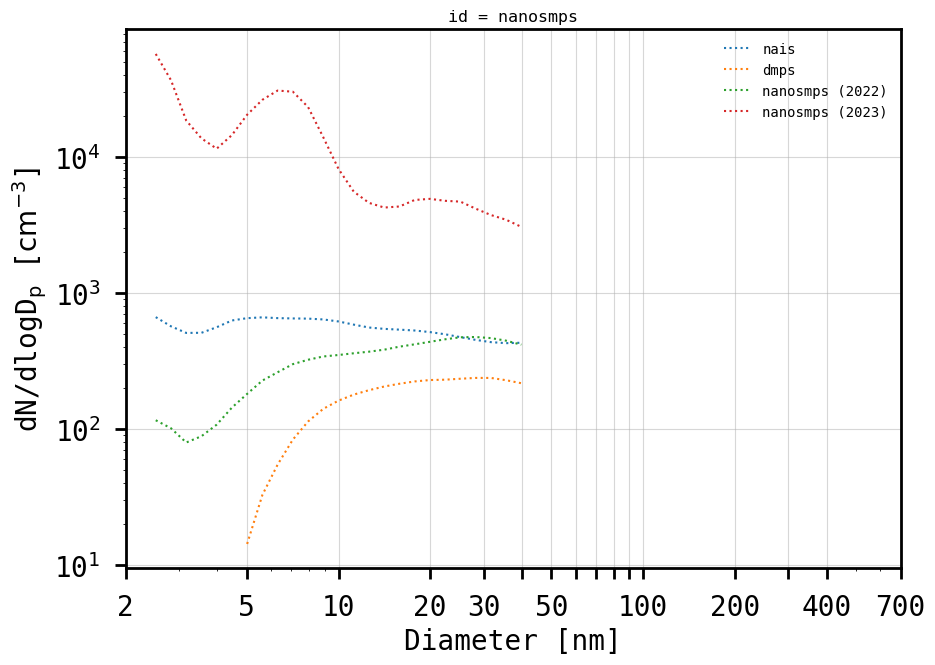

In [33]:
diameters_ticks = [2, 5,10,20,30,40,50,60,70,80,90,100,200,300,400, 700]
diameters_ticks = [x*10**(-9) for x in diameters_ticks]
print(diameters_ticks)

fig, ax = plt.subplots(figsize=(10,7))
pnsd_size_distribution(ds_nais, var='dndlDp', diameters_ticks=diameters_ticks, label='nais', ax=ax)
pnsd_size_distribution(ds_dmps_valid_time_dp, var='dndlDp', diameters_ticks=diameters_ticks,label='dmps', ax=ax)
pnsd_size_distribution(ds_nanosmps_valid_time_dp_2022, var='dndlDp', diameters_ticks=diameters_ticks,label='nanosmps (2022)', ax=ax)
pnsd_size_distribution(ds_nanosmps_valid_time_dp_2023, var='dndlDp', diameters_ticks=diameters_ticks,label='nanosmps (2023)', ax=ax)
plt.show()

[2e-09, 5e-09, 1e-08, 2e-08, 3.0000000000000004e-08, 4e-08, 5.0000000000000004e-08, 6.000000000000001e-08, 7e-08, 8e-08, 9.000000000000001e-08, 1.0000000000000001e-07, 2.0000000000000002e-07, 3.0000000000000004e-07, 4.0000000000000003e-07, 7.000000000000001e-07]


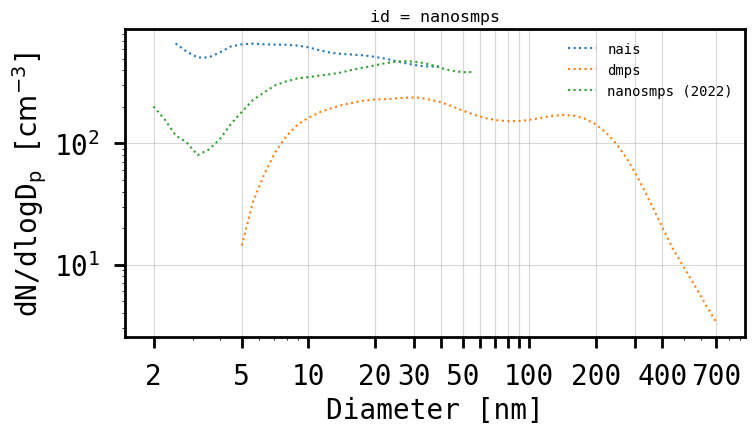

In [ ]:
diameters_ticks = [2, 5,10,20,30,40,50,60,70,80,90,100,200,300,400, 700]
diameters_ticks = [x*10**(-9) for x in diameters_ticks]
print(diameters_ticks)

fig, ax = plt.subplots(figsize=(8,4))
pnsd_size_distribution(ds_nais, var='dndlDp', diameters_ticks=diameters_ticks, label='nais', ax=ax)
pnsd_size_distribution(ds_dmps_valid_time, var='dndlDp', diameters_ticks=diameters_ticks,label='dmps', ax=ax)
pnsd_size_distribution(ds_nanosmps_valid_time_2022, var='dndlDp', diameters_ticks=diameters_ticks,label='nanosmps (2022)', ax=ax)
ax.set_title('')
plt.show()

Here, via comparing to the DMPS (ratio of DMPS to NAIS) in the overlapping size range 6–42 nm, a correction factor for the NAIS can be derived. The NAIS was found to overestimate the concentration by a factor 5, which is the factor used to correct the NAIS concertation prior to the combination of the size distributions from the three instruments (Fig. S2†). 

In [35]:
def limit_dfs_values(df, x_var, y_var, xmin=0, xmax=60, ymin=0, ymax=60):
    df.loc[df[x_var] < xmin, [x_var]] = np.nan
    df.loc[df[x_var] > xmax, [x_var]] = np.nan
    df.loc[df[y_var] < ymin, [y_var]] = np.nan
    df.loc[df[y_var] > ymax, [y_var]] = np.nan
    df = df.dropna(subset=[x_var, y_var], how='any')
    return df

def remove_quantile(df, threshold_quantile = 0.95):
    df = df.copy()
    threshold_value = df.quantile(threshold_quantile)
    print("threshold value: "+str(threshold_value))
    for column in df.columns:
        df.loc[df[column] > threshold_value[column], column] = np.nan
    return df

def produced_regression(df, x_var, y_var, xmin=0, xmax=1000, 
                        ymin=0, ymax=1000, set_max_value=1000,
                        title='', ylabel=None, xlabel=None, fit_intercept=False,
                        threshold_quantile = 0.99):
    
    fig, ax = plt.subplots(figsize=(4,4))

    df = limit_dfs_values(df, x_var, y_var, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax)    
    df = remove_quantile(df, threshold_quantile = threshold_quantile)    
    df = df[~df.isin([np.nan, np.inf, -np.inf]).any(axis=1)] #remove any infs or np.nan 
    #LMS
    model = linear_model.LinearRegression(fit_intercept=fit_intercept)    
    x = np.array(df[x_var].values)
    y = np.array(df[y_var].values) 
    
    if set_max_value == None:
        set_max_value = max(max(x), max(y))
        print(set_max_value)

    model.fit(x[:, np.newaxis], y)
    R2 = model.score(x[:, np.newaxis], y)
    R2 =  "{:.2f}".format(float(R2))
    xfit = x
    yfit = model.predict(xfit[:, np.newaxis])
    intercept = "{:.2f}".format(float(model.intercept_))
    coef = "{:.3f}".format(float(model.coef_[0]))    
    cf_LMS = float(1/(model.coef_[0]))

    if np.sign(float(intercept)) == 1:
        sign_str = '+'
    else:
        sign_str = ''

    smap = ax.scatter(x, y, s=10, edgecolors='k', c='None', lw=0.5, alpha=0.6, vmin=0.5, vmax=1)
    ax.plot(xfit, yfit, ls=':', color='blue', linewidth=2, label='Fitted Line: \ny = '+str(coef)+'$\,$x '+str(sign_str)+str(intercept)+
           '\nR$^{2}$ = '+str(R2)+'\nCF = '+str("{:.3f}".format(cf_LMS) )) 
    ax.plot(np.linspace(0, set_max_value, num=10), np.linspace(0, set_max_value, num=10), 
            linestyle='--', alpha=0.5, c='k')
    
    ax.legend(title=title)
    
    if ylabel is None: 
        ax.set_ylabel(y_var.replace('_',' '))
    if xlabel is None:
        ax.set_xlabel(x_var.replace('_',' '))
        
    if ylabel is not None: 
        ax.set_ylabel(ylabel)
    if xlabel is not None:
        ax.set_xlabel(xlabel)
        
    ax.set_yscale('log')
    ax.set_xscale('log')   
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.xaxis.set_major_locator(mticker.LogLocator(numticks=999))
    ax.xaxis.set_minor_locator(mticker.LogLocator(numticks=999, subs="auto"))
    ax.yaxis.set_major_locator(mticker.LogLocator(numticks=999))
    ax.yaxis.set_minor_locator(mticker.LogLocator(numticks=999, subs="auto"))
    
    ax.tick_params(axis="x", which="both", top=True, labeltop=False, bottom=True, labelbottom=True, direction="inout")
    ax.tick_params(axis="y", which="both", top=True, labeltop=False, bottom=True, labelbottom=False, 
                   right=True, direction="inout")
    
    ax.grid(True, alpha=.5)    
    #plt.show()
    return fig

def produced_regression_stats(df, x_var, y_var, 
                       xmin=0, xmax=1000, ymin=0, ymax=1000, set_max_value=1000,
                       title='', fit_intercept=False, threshold_quantile = 0.99):
    
    df = limit_dfs_values(df, x_var, y_var, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax)    
    df = remove_quantile(df, threshold_quantile = threshold_quantile)    
    df = df[~df.isin([np.nan, np.inf, -np.inf]).any(axis=1)] #remove any infs or np.nan 
    
    #LMS    
    model = linear_model.LinearRegression(fit_intercept=fit_intercept)    
    x = np.array(df[x_var].values)
    y = np.array(df[y_var].values) 
        
    set_max_value = max(max(x), max(y))

    model.fit(x[:, np.newaxis], y)
    R2 = model.score(x[:, np.newaxis], y)
    R2 =  "{:.2f}".format(float(R2))
    xfit = x
    yfit = model.predict(xfit[:, np.newaxis])
    intercept = "{:.2f}".format(float(model.intercept_))
    coef = "{:.2f}".format(float(model.coef_[0]))    
    cf_LMS = float(1/(model.coef_[0]))    
    return R2, coef

def perform_comparsion(xr1, xr2, instrument1='instrument1', instrument2='instrument2', var='dndlDp', 
                       xmin=0, ymin=0, xmax=10**4, ymax=10**4, set_max_value=10**4, 
                      fit_intercept=False):
    
    diameters = list(xr1.Dp.values)
    # xr1 = xr1.loc[{'id':instrument1}].copy()
    # xr2 = xr2.loc[{'id':instrument2}].copy()

    df_dia_NAISs = pd.DataFrame(columns=['diameter', 'R2', 'coef'])
    for i, diameter in enumerate(diameters):
        
        size_bin1 = xr1.sel({'Dp':diameter}, method='nearest')
        size_bin2 = xr2.sel({'Dp':diameter}, method='nearest')

        size_bin1 = size_bin1[var].values
        size_bin2 = size_bin2[var].values

        print(size_bin1)
        print(size_bin2)

        print(len(size_bin1))
        print(len(size_bin2))

        df = pd.DataFrame({instrument1:size_bin1, instrument2:size_bin2})
        df = df.replace(0, np.nan)
        df = df.dropna(how='all', axis=1)
        df = df.dropna(how='all', axis=0)

        if (len(df) > 0) & (len(df.columns) == 2):
            print(df)
            fig = produced_regression(df, x_var=instrument1, y_var=instrument2, 
                                   xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax, set_max_value=set_max_value,
                                   title='D$_{\mathrm{p}}$: '+str(np.round(diameter*10**9, 3))+' nm', fit_intercept=fit_intercept)
            
            R2, coef = produced_regression_stats(df, x_var=instrument1, y_var=instrument2,
                                                 xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax, 
                                                 set_max_value=set_max_value, 
                                                 fit_intercept=fit_intercept)
            
            print("Diameter: "+str(diameter))
            print("R2: "+str(R2))
            print("Coef: "+str(coef))
            
            df_dia_NAISs.loc[i, 'diameter'] = diameter*10**9
            df_dia_NAISs.loc[i, 'R2'] = R2
            df_dia_NAISs.loc[i, 'coef'] = coef
    df_dia_NAISs = df_dia_NAISs.astype(float)
    return df_dia_NAISs

In [36]:
df_dmps = ds_dmps_valid_time_dp.loc[{'id':'dmps'}]['dndlDp'].to_pandas()
df_nais = ds_nais.loc[{'id':'nais'}]['dndlDp'].to_pandas() #convert regridded

In [37]:
def select_df_using_another(df1, df2):
    print("df1: "+str(len(df1)))
    df1 = df1.dropna(how='all', axis=1)
    df1 = df1.dropna(how='all', axis=0)
    print("df1: "+str(len(df1)))
    
    print("df2: "+str(len(df2)))
    df2 = df2.dropna(how='all', axis=1)
    df2 = df2.dropna(how='all', axis=0)
    print("df2: "+str(len(df2)))
        
    print("select for df2: "+str(len(df2.index)))
    
    df1_datetimes = list(df1.index.values)
    df2_datetimes = list(df2.index.values)
    df_datetimes = set(df1_datetimes)&set(df2_datetimes)
    print(len(df_datetimes))
    
    df1 = df1.reset_index()
    df1 = df1[df1['time'].isin(df_datetimes)].set_index('time')
    df1.index = pd.to_datetime(df1.index)
    df1.columns = df1.columns.astype(float)
    return df1

In [38]:
#have to collocate again for some reasons
df_dmps = select_df_using_another(df_dmps, df_nais)
df_nais = select_df_using_another(df_nais, df_dmps)

#de normalise for regression
df_dmps_dn = dndlogdp2dn(df_dmps)
df_nais_dn = dndlogdp2dn(df_nais)

#convert to xarray
ds_dmps_dn = convert_to_xarray(df_dmps_dn, new_name="dndlDp", diameter_name='Dp')
ds_nais_dn = convert_to_xarray(df_nais_dn, new_name="dndlDp", diameter_name='Dp')

df1: 43014
df1: 33742
df2: 43297
df2: 37228
select for df2: 37228
30278
df1: 43297
df1: 37228
df2: 30278
df2: 30278
select for df2: 30278
30278


In [39]:
ds_nais_dn

<xarray.Dataset>
Dimensions:  (Dp: 25, time: 21495)
Coordinates:
  * Dp       (Dp) float64 2.512e-09 2.818e-09 3.162e-09 ... 3.548e-08 3.981e-08
  * time     (time) datetime64[ns] 2022-04-17T12:00:00 ... 2024-09-29T02:00:00
Data variables:
    dndlDp   (time, Dp) float64 27.89 42.81 114.1 258.8 ... 1.674 1.853 1.943

In [40]:
ds_nais_dn.Dp

<xarray.DataArray 'Dp' (Dp: 25)>
array([2.511886e-09, 2.818383e-09, 3.162278e-09, 3.548134e-09, 3.981072e-09,
       4.466836e-09, 5.011872e-09, 5.623413e-09, 6.309573e-09, 7.079458e-09,
       7.943282e-09, 8.912509e-09, 1.000000e-08, 1.122018e-08, 1.258925e-08,
       1.412538e-08, 1.584893e-08, 1.778279e-08, 1.995262e-08, 2.238721e-08,
       2.511886e-08, 2.818383e-08, 3.162278e-08, 3.548134e-08, 3.981072e-08])
Coordinates:
  * Dp       (Dp) float64 2.512e-09 2.818e-09 3.162e-09 ... 3.548e-08 3.981e-08

In [41]:
dmps_Dps = list(ds_dmps_dn.Dp.values)

In [42]:
ds_nais_dn = ds_nais_dn.sel(Dp=dmps_Dps)

[548.96837641 445.24838053 375.26264055 ...   5.25471473   6.0296603
   9.03309552]
[1.20644138e+00 2.19912538e-01 2.44980884e-01 ... 4.12870049e-30
 4.12614275e-30 4.12298467e-30]
21495
21495
             nais          dmps
0      548.968376  1.206441e+00
1      445.248381  2.199125e-01
2      375.262641  2.449809e-01
3      258.729222  1.213205e+00
4      129.714300  1.282874e+00
...           ...           ...
21490   11.867006  4.134363e-30
21491    7.293922  4.130846e-30
21492    5.254715  4.128700e-30
21493    6.029660  4.126143e-30
21494    9.033096  4.122985e-30

[15238 rows x 2 columns]
threshold value: nais    576.672671
dmps     24.420291
Name: 0.99, dtype: float64
threshold value: nais    576.672671
dmps     24.420291
Name: 0.99, dtype: float64
Diameter: 5.011872336272715e-09
R2: 0.46
Coef: 0.03
[544.05559938 540.28205951 497.82024455 ...   4.67930651   5.68239027
   7.84819285]
[6.33602275e+00 6.25519169e+00 9.42041843e+00 ... 3.88896965e-30
 3.88655825e-30 3.88358065e-30]

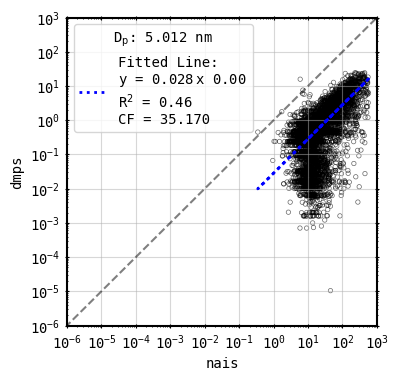

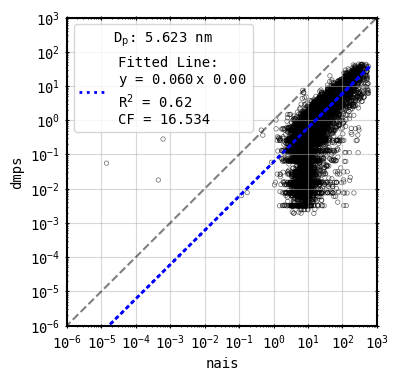

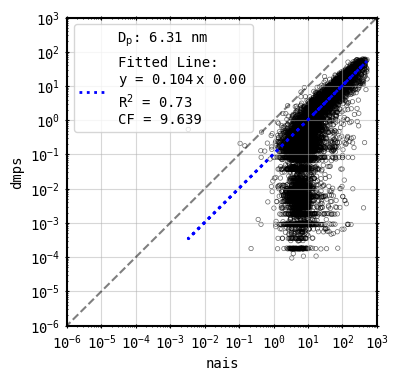

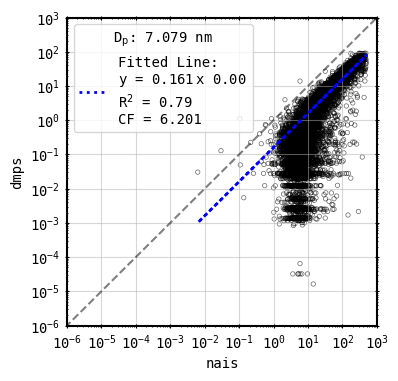

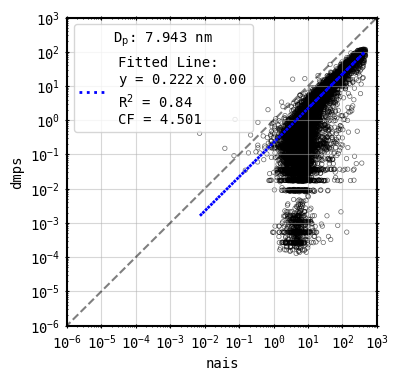

...

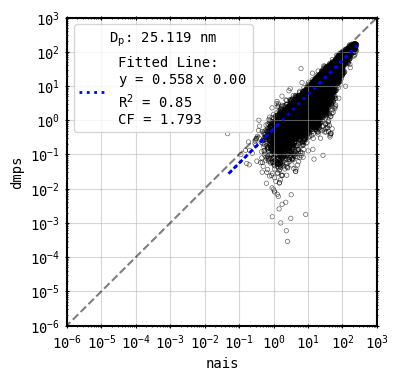

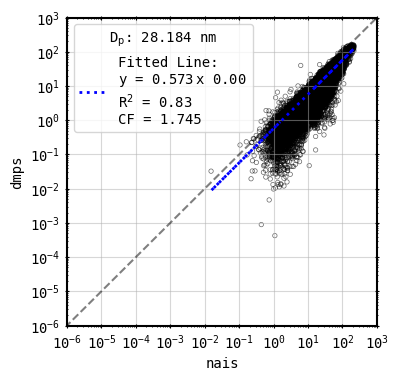

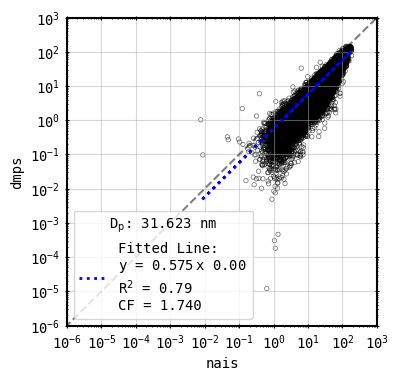

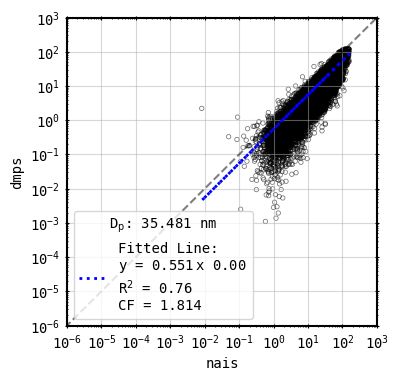

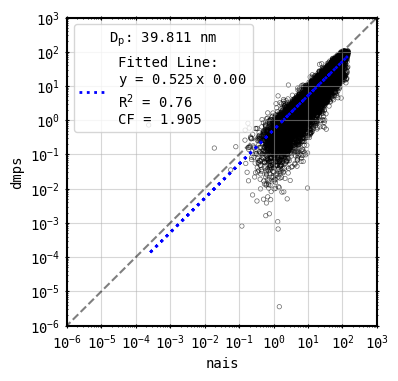

In [43]:
df_dia_coefs_R2s = perform_comparsion(ds_nais_dn, ds_dmps_dn, instrument1='nais', instrument2='dmps',
                   var='dndlDp', xmin=10**(-6), ymin=10**(-6), xmax=10**3, ymax=10**3, set_max_value=10**3, 
                   fit_intercept=False)

In [44]:
def plot_regression(df_dia_NAISs, var, top=1.1, bottom=-1):
    fig, ax = plt.subplots(figsize=(8,4))
    im = ax.scatter(df_dia_NAISs.diameter, df_dia_NAISs.coef, c=df_dia_NAISs.R2, vmin=-1, vmax=1, cmap='seismic')
    cax = fig.add_axes([0.15, 0.8, 0.4, 0.05])
    cbar = fig.colorbar(im, cax=cax, orientation='horizontal')
    cbar.set_label('R$^{2}$')

    ax.set_ylim(bottom=bottom, top=top)
    ax.set_ylabel(str(var).replace('_',' ')+'\nCoef. (DMPS/NAIS-5) [-]', fontsize=20)
    ax.set_xlabel('Diameter [nm]', fontsize=20)
    ax.set_xscale('log')
    ax.grid(True)
    ax.tick_params(axis='both', which='major', labelsize=15)
    ax.tick_params(axis='both', which='minor', labelsize=15)    
    xticks = [3,5,10,20,30,40] #nm
    ax.set_xticks(xticks)
    ax.set_xticklabels([3,5,10,20,30,40], fontsize=15)
    thickax(ax, fontsize=12)
    
    ax.hlines(y = .2, xmin = 6, xmax = 42, color='b', alpha=.2, lw=5, 
              label='Dada et al. 2023: CF of 1/5 for 6–42 nm',)
    
    df_dia_coefs_R2s_good = df_dia_coefs_R2s[df_dia_coefs_R2s['R2']>0.8].copy()
    average_CF = df_dia_coefs_R2s_good.coef.mean()
    print(average_CF)

    min_diameter = df_dia_coefs_R2s_good.diameter.iloc[0]
    max_diameter = df_dia_coefs_R2s_good.diameter.iloc[-1]

    ax.hlines(y=average_CF, xmin=min_diameter, xmax = max_diameter, color='r', alpha=.2, lw=5, 
              label='average CF, R$^{2}$ > .8',)
    ax.legend(loc=3)
    
    plt.show()
    return fig

0.44250000000000006


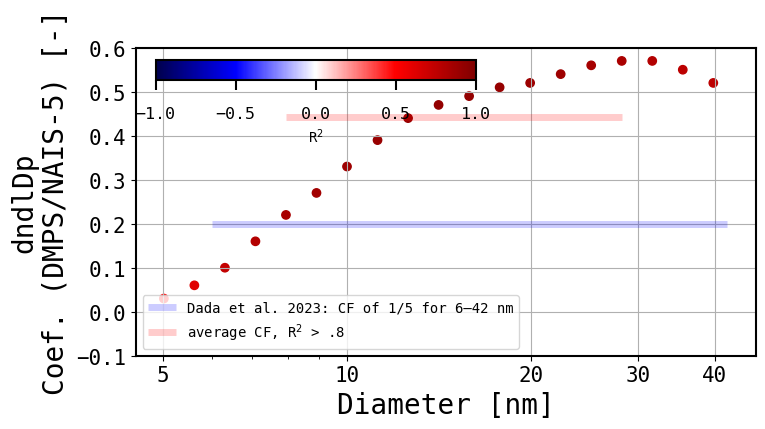

In [45]:
fig = plot_regression(df_dia_coefs_R2s, var='dndlDp', top=.6, bottom=-.1)

In [46]:
def slice_dim_xr(ds, min_dim=None, max_dim = 2e-8):
    return ds.loc[{'Dp':slice(min_dim, max_dim)}]

In [47]:
def perform_comparsion_total(xr1, xr2, instrument1='instrument1', instrument2='instrument2', var='dndlDp', 
                       xmin=0, ymin=0, xmax=10**4, ymax=10**4, set_max_value=10**4, 
                      fit_intercept=False, min_dim=10e-9, max_dim=20e-9):
    
    diameters = list(xr1.Dp.values)
    # xr1 = xr1.loc[{'id':instrument1}].copy()
    # xr2 = xr2.loc[{'id':instrument2}].copy()

    xr1 = slice_dim_xr(xr1, min_dim, max_dim)
    xr2 = slice_dim_xr(xr2, min_dim, max_dim)

    range_diameters = str(min_dim*10**9)+'-'+str(max_dim*10**9)

    df_dia_NAISs = pd.DataFrame(columns=['diameter', 'R2', 'coef'])

    xr1_totn = xr1.sum('Dp')['dndlDp'].values
    xr2_totn = xr2.sum('Dp')['dndlDp'].values

    df = pd.DataFrame({instrument1:xr1_totn, instrument2:xr2_totn})
    df = df.replace(0, np.nan)
    df = df.dropna(how='all', axis=1)
    df = df.dropna(how='all', axis=0)

    if (len(df) > 0) & (len(df.columns) == 2):
        fig = produced_regression(df, x_var=instrument1, y_var=instrument2, 
                                xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax, set_max_value=set_max_value,
                                title='D$_{\mathrm{p}}$: '+str(range_diameters)+' nm', fit_intercept=fit_intercept)
        
        R2, coef = produced_regression_stats(df, x_var=instrument1, y_var=instrument2,
                                                xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax, 
                                                set_max_value=set_max_value, 
                                                fit_intercept=fit_intercept)
        
        #print("Diameter: "+str(diameter))
        print("R2: "+str(R2))
        print("Coef: "+str(coef))
        
    df_dia_NAISs.loc[0,'diameter'] = range_diameters
    df_dia_NAISs.loc[0,'R2'] = R2
    df_dia_NAISs.loc[0,'coef'] = coef
    #df_dia_NAISs[['R2','coef']] = df_dia_NAISs[['R2','coef']].astype(float)
    return df_dia_NAISs

threshold value: nais    2627.557854
dmps    1271.343070
Name: 0.99, dtype: float64
threshold value: nais    2627.557854
dmps    1271.343070
Name: 0.99, dtype: float64
R2: 0.91
Coef: 0.44


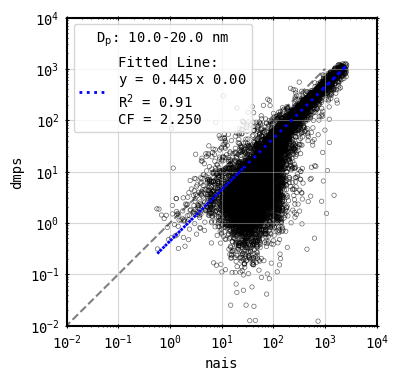

In [48]:
df_dia_NAISs = perform_comparsion_total(ds_nais_dn, ds_dmps_dn, instrument1='nais', instrument2='dmps',
                   var='dndlDp', xmin=10**(-2), ymin=10**(-2), xmax=10**4, ymax=10**4, set_max_value=10**3, 
                   fit_intercept=False)

In [49]:
CF = float(df_dia_NAISs['coef'].iloc[0])

In [50]:
ds_nais_dn_CF = ds_nais_dn*CF

In [51]:
def get_dlogdp(df):
    logdp_mid = np.log10(df.columns.values.astype(float))
    logdp = (logdp_mid[:-1]+logdp_mid[1:])/2.0
    logdp = np.append(logdp,logdp_mid.max()+(logdp_mid.max()-logdp.max()))
    logdp = np.insert(logdp,0,logdp_mid.min()-(logdp.min()-logdp_mid.min()))
    dlogdp = np.diff(logdp)
    return dlogdp

In [52]:
df_nais_dn_CF = ds_nais_dn_CF['dndlDp'].to_pandas()

In [53]:
dlogdps_nais = get_dlogdp(df_nais_dn_CF)

In [54]:
dlogdps_nais 

array([0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05,
       0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05])

In [55]:
ds_nais_dn_dlogdp_CF=ds_nais_dn_CF/0.05

In [56]:
ds_nais_dn_dlogdp_CF

<xarray.Dataset>
Dimensions:  (Dp: 19, time: 21495)
Coordinates:
  * Dp       (Dp) float64 5.012e-09 5.623e-09 6.31e-09 ... 3.548e-08 3.981e-08
  * time     (time) datetime64[ns] 2022-04-17T12:00:00 ... 2024-09-29T02:00:00
Data variables:
    dndlDp   (time, Dp) float64 4.831e+03 4.788e+03 4.872e+03 ... 16.3 17.1

[2e-09, 5e-09, 1e-08, 2e-08, 3.0000000000000004e-08, 4e-08, 5.0000000000000004e-08, 6.000000000000001e-08, 7e-08, 8e-08, 9.000000000000001e-08, 1.0000000000000001e-07, 2.0000000000000002e-07, 3.0000000000000004e-07, 4.0000000000000003e-07, 7.000000000000001e-07]


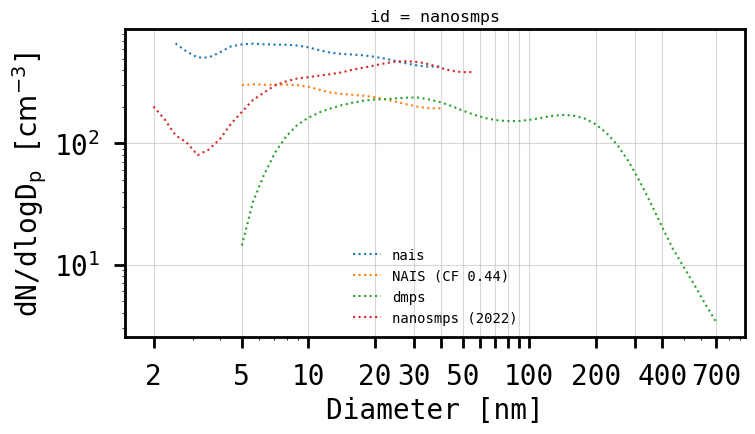

In [57]:
diameters_ticks = [2, 5,10,20,30,40,50,60,70,80,90,100,200,300,400, 700]
diameters_ticks = [x*10**(-9) for x in diameters_ticks]
print(diameters_ticks)

fig, ax = plt.subplots(figsize=(8,4))
pnsd_size_distribution(ds_nais, var='dndlDp', diameters_ticks=diameters_ticks, label='nais', ax=ax)
pnsd_size_distribution(ds_nais_dn_dlogdp_CF, var='dndlDp', diameters_ticks=diameters_ticks,label='NAIS (CF '+str(CF)+')', ax=ax)
pnsd_size_distribution(ds_dmps_valid_time, var='dndlDp', diameters_ticks=diameters_ticks,label='dmps', ax=ax)
pnsd_size_distribution(ds_nanosmps_valid_time_2022, var='dndlDp', diameters_ticks=diameters_ticks,label='nanosmps (2022)', ax=ax)
plt.show()

In [58]:
def get_nais_dmps(d):
    d1 = d[['dndlDp']].loc[{'id':'nais','Dp':slice(0,2.e-8)}]
    d2 = d[['dndlDp']].loc[{'id':'dmps','Dp':slice(2.e-8+.00001e-8,1)}]
    dc = xr.concat([d1, d2], dim='Dp')
    dc['id'] = 'nd'
    dcc = xr.concat([d,dc],dim='id')
    return dcc

In [59]:
ds_dmps

<xarray.Dataset>
Dimensions:  (id: 1, time: 65622, Dp: 44)
Coordinates:
  * id       (id) object 'dmps'
  * time     (time) datetime64[ns] 2021-01-01 ... 2024-09-29T02:30:00
    lDp      (Dp) float64 -8.3 -8.25 -8.2 -8.15 -8.1 ... -6.3 -6.25 -6.2 -6.15
  * Dp       (Dp) float64 5.012e-09 5.623e-09 6.31e-09 ... 6.31e-07 7.079e-07
Data variables:
    dndlDp   (id, time, Dp) float64 8.096e-29 7.626e-29 ... 1.705e-29 1.675e-29

In [60]:
ds_nais_dn_dlogdp_CF = ds_nais_dn_dlogdp_CF.expand_dims({'id':['nais']})

In [61]:
d1 = (xr.concat([ds_dmps,ds_nais*CF], dim='id'))
ds_N = d1.pipe(get_nais_dmps)

In [62]:
ds_N['time'] = pd.DatetimeIndex(ds_N['time'].values)
ds_N = ds_N.loc[{'id':'nd'}].copy()
ds_N['dndlDp'] = ds_N['dndlDp'].astype(float)
ds_N['Dp'] = ds_N['Dp'].astype(float)
ds_N = ds_N.sortby('time')

In [63]:
ds_N

<xarray.Dataset>
Dimensions:  (time: 65905, Dp: 50)
Coordinates:
  * time     (time) datetime64[ns] 2021-01-01 2021-01-01T00:30:00 ... 2024-10-05
  * Dp       (Dp) float64 2.512e-09 2.818e-09 3.162e-09 ... 6.31e-07 7.079e-07
    id       <U2 'nd'
    lDp      (Dp) float64 -8.6 -8.55 -8.5 -8.45 -8.4 ... -6.3 -6.25 -6.2 -6.15
Data variables:
    dndlDp   (time, Dp) float64 nan nan nan nan nan nan ... nan nan nan nan nan

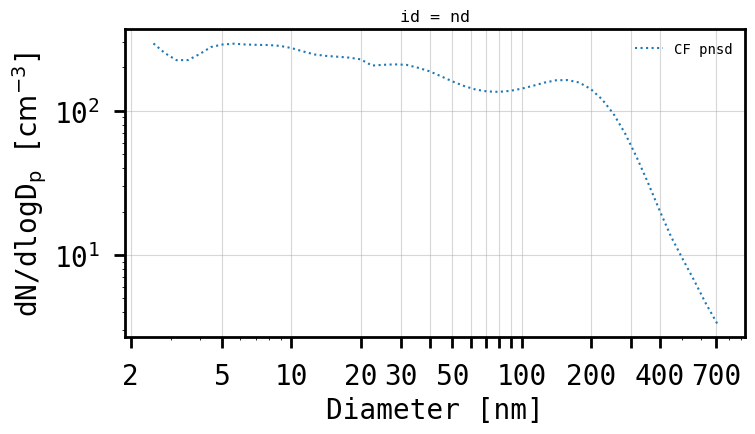

In [64]:

fig, ax = plt.subplots(figsize=(8,4))
pnsd_size_distribution(ds_N, var='dndlDp', diameters_ticks=diameters_ticks, label='CF pnsd', ax=ax)
# pnsd_size_distribution(ds_nais_dn_dlogdp_CF, var='dndlDp', diameters_ticks=diameters_ticks,label='NAIS (CF '+str(CF)+')', ax=ax)
# pnsd_size_distribution(ds_dmps_valid_time, var='dndlDp', diameters_ticks=diameters_ticks,label='dmps', ax=ax)
# pnsd_size_distribution(ds_nanosmps_valid_time_2022, var='dndlDp', diameters_ticks=diameters_ticks,label='nanosmps (2022)', ax=ax)
plt.show()

In [65]:
# Define the start and end datetimes
start_datetime = pd.to_datetime(ds_nais_dn.time.values[0])
end_datetime = pd.to_datetime(ds_nais_dn.time.values[-1])

start_datetime = pd.to_datetime('2022-02-01')
end_datetime = pd.to_datetime('2025-01-31')

start_datetime = datetime(start_datetime.year, start_datetime.month, 1, 0, 0)
end_datetime = datetime(end_datetime.year, end_datetime.month, 1, 0, 0)

# Function to generate datetimes 4 months apart
def generate_datetimes(start, end, months=4):
    datetime_list = [start]
    current = start
    while current <= end:
        print(current)
        current += relativedelta(months=months)
        datetime_list.append(current)
    return datetime_list

datetime_list = generate_datetimes(start_datetime, end_datetime, months=4)
if end_datetime > datetime_list[-1]:
    datetime_list.append(end_datetime)
    print(datetime_list)

2022-02-01 00:00:00
2022-06-01 00:00:00
2022-10-01 00:00:00
2023-02-01 00:00:00
2023-06-01 00:00:00
2023-10-01 00:00:00
2024-02-01 00:00:00
2024-06-01 00:00:00
2024-10-01 00:00:00


2022-02-01 00:00:00 2022-06-01 00:00:00
<xarray.Dataset>
Dimensions:  (Dp: 19, time: 1069)
Coordinates:
  * Dp       (Dp) float64 5.012e-09 5.623e-09 6.31e-09 ... 3.548e-08 3.981e-08
  * time     (time) datetime64[ns] 2022-04-17T12:00:00 ... 2022-06-01
Data variables:
    dndlDp   (time, Dp) float64 549.0 544.1 553.6 580.0 ... 22.59 29.34 36.17
<xarray.Dataset>
Dimensions:  (Dp: 19, time: 1069)
Coordinates:
  * Dp       (Dp) float64 5.012e-09 5.623e-09 6.31e-09 ... 3.548e-08 3.981e-08
  * time     (time) datetime64[ns] 2022-04-17T12:00:00 ... 2022-06-01
Data variables:
    dndlDp   (time, Dp) float64 1.206 6.336 18.06 43.74 ... 6.657 7.364 8.519
[548.96837641 445.24838053 375.26264055 ...   7.27105076   7.66449563
   8.03176684]
[1.20644138e+00 2.19912538e-01 2.44980884e-01 ... 4.01523444e-30
 4.01355902e-30 8.65125113e-01]
1069
1069
          NAIS-5          DMPS
0     548.968376  1.206441e+00
1     445.248381  2.199125e-01
2     375.262641  2.449809e-01
3     258.729222  1.213205e+00

C:\Users\DominicHeslinRees\AppData\Local\Temp\ipykernel_16988\4099312416.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(4,4))


threshold value: NAIS-5    542.084604
DMPS       59.870383
Name: 0.99, dtype: float64
threshold value: NAIS-5    542.084604
DMPS       59.870383
Name: 0.99, dtype: float64
Diameter: 6.309573444801917e-09
R2: 0.77
Coef: 0.09
[ 4.00439165 10.01425304 16.62953807 ...  6.20953673  4.32810152
  6.59154386]
[4.13457744e-01 1.56872581e+00 2.72622363e+00 ... 9.03807696e-02
 2.87250454e-01 3.44308146e-30]
2929
2929
         NAIS-5          DMPS
0      4.004392  4.134577e-01
1     10.014253  1.568726e+00
2     16.629538  2.726224e+00
3     13.605024  6.888627e-01
4     10.384362  1.626594e+00
...         ...           ...
2924   5.004663  2.515407e-01
2925  10.281503  4.477046e-01
2926   6.209537  9.038077e-02
2927   4.328102  2.872505e-01
2928   6.591544  3.443081e-30

[2079 rows x 2 columns]
threshold value: NAIS-5    555.698366
DMPS       81.025222
Name: 0.99, dtype: float64
threshold value: NAIS-5    555.698366
DMPS       81.025222
Name: 0.99, dtype: float64
Diameter: 7.0794578438413736e-09


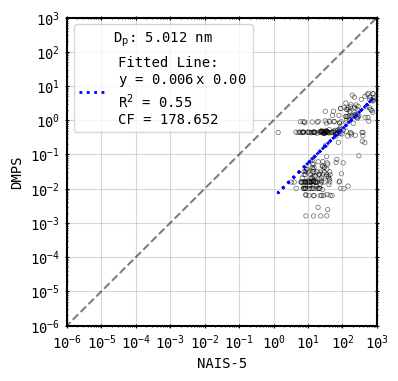

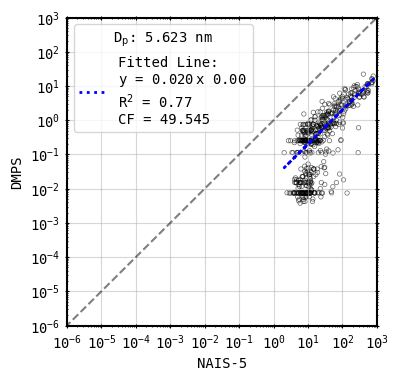

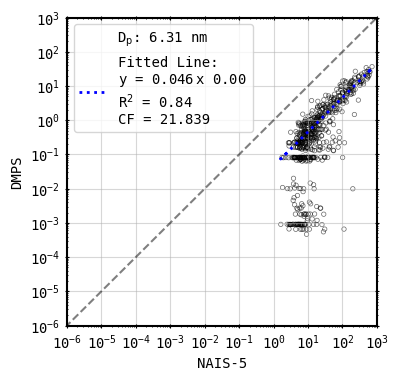

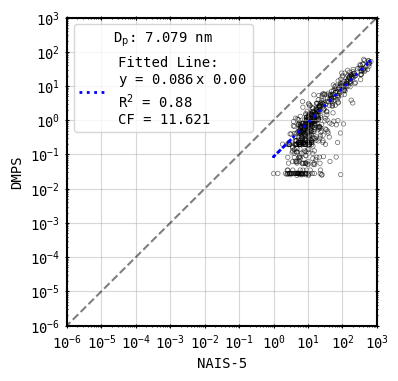

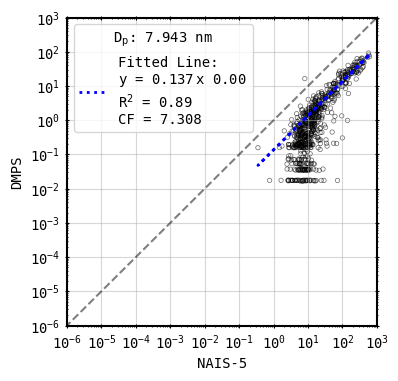

...

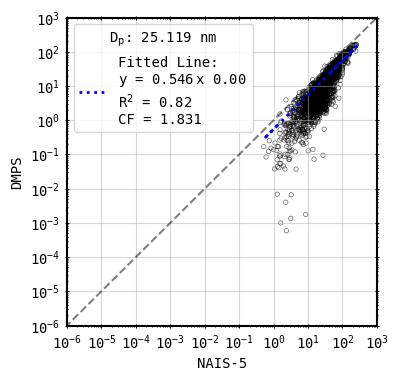

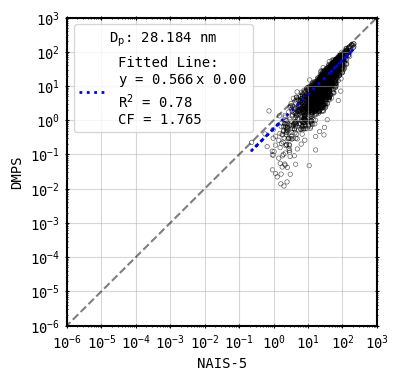

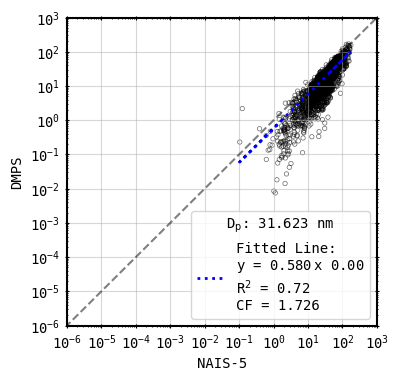

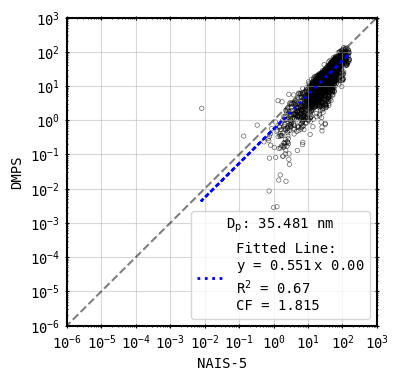

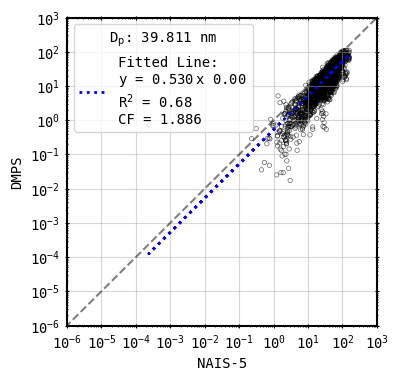

In [66]:
#time slice 
dict_df_coefs_start = {}
for i in range(len(datetime_list)):
    if i+1 < len(datetime_list):        
        start = datetime_list[i]
        end = datetime_list[i+1]
        print(start, end)
        
        ds_nais_sliced = ds_nais_dn.sel(time=slice(start, end)).copy(deep=True)
        print(ds_nais_sliced)
        
        ds_dmps_sliced = ds_dmps_dn.sel(time=slice(start, end)).copy(deep=True)
        print(ds_dmps_sliced)
        
        df_dia_coefs_R2s = perform_comparsion(ds_nais_sliced, ds_dmps_sliced, instrument1='NAIS-5', instrument2='DMPS',
                   var='dndlDp', xmin=10**(-6), ymin=10**(-6), xmax=10**3, ymax=10**3, set_max_value=10**3, 
                   fit_intercept=False)
        interval = str(start.date())+' - '+str(end.date())
        dict_df_coefs_start[interval] = df_dia_coefs_R2s

In [67]:
dates = [*dict_df_coefs_start.keys()]
print(dates)

['2022-02-01 - 2022-06-01', '2022-06-01 - 2022-10-01', '2022-10-01 - 2023-02-01', '2023-02-01 - 2023-06-01', '2023-06-01 - 2023-10-01', '2023-10-01 - 2024-02-01', '2024-02-01 - 2024-06-01', '2024-06-01 - 2024-10-01', '2024-10-01 - 2025-02-01']


In [68]:
def plot_regression_dict(dict_df_coefs_start, var, top=2.1, bottom=-1):
    fig, ax = plt.subplots(figsize=(8,5))
    
    dates = [*dict_df_coefs_start.keys()]
    print(dates)
    for date in dates:
        print(date[5:7])
        df_dia_NAISs = dict_df_coefs_start[date]

        if int(date[5:7]) == 2: #haze
            season = 'AHZ'
            marker = "^"
            if int(date[:4]) == 2022:                
                c='deepskyblue'
            if int(date[:4]) == 2023:                
                c='royalblue'
            if int(date[:4]) == 2024:
                c='b'

        if int(date[5:7]) == 6: #sum
            season = 'SUM'
            marker = "o"
            if int(date[:4]) == 2022:                
                c='lightcoral'
            if int(date[:4]) == 2023:                
                c='coral'
            if int(date[:4]) == 2024:
                c='peru'

        if int(date[5:7]) == 10: #
            season = 'SBU'
            marker = "v"
            if int(date[:4]) == 2022:                
                c='silver'
            if int(date[:4]) == 2023:                
                c='grey'
            if int(date[:4]) == 2024:
                c='black'
    
        print(marker)
        im = ax.scatter(df_dia_NAISs.diameter, df_dia_NAISs.coef, c=df_dia_NAISs.R2, vmin=-1, vmax=1, cmap='seismic', marker=marker, label=season)
        ax.plot(df_dia_NAISs.diameter, df_dia_NAISs.coef, marker=marker, ms=0, label=date, c=c, lw=2)
    
    cax = fig.add_axes([.95, 0.1, 0.02, 0.75])
    cbar = fig.colorbar(im, cax=cax, orientation='vertical')
    cbar.set_label('R$^{2}$')    
    ax.legend()
    ax.set_ylim(bottom=bottom, top=top)
    ax.set_ylabel(str(var).replace('_',' ')+'\nCoef. (DMPS/NAIS-5) [-]', fontsize=20)
    ax.set_xlabel('Diameter [nm]', fontsize=20)
    ax.set_xscale('log')
    ax.grid(True)
    ax.tick_params(axis='both', which='major', labelsize=15)
    ax.tick_params(axis='both', which='minor', labelsize=15)    
    xticks = [3,5,10,20,30,40] #nm
    ax.set_xticks(xticks)
    ax.set_xticklabels([3,5,10,20,30,40], fontsize=15)
    thickax(ax, fontsize=12)
    
    ax.hlines(y = .2, xmin = 3, xmax = 40, color='b', alpha=.2, lw=5, 
              label='Dada et al. 2023: CF of 1/5 for 6–42 nm',)
    ax.legend(title='periods:',bbox_to_anchor=(1.3, 1), frameon=False)
    
    plt.show()
    return fig

['2022-02-01 - 2022-06-01', '2022-06-01 - 2022-10-01', '2022-10-01 - 2023-02-01', '2023-02-01 - 2023-06-01', '2023-06-01 - 2023-10-01', '2023-10-01 - 2024-02-01', '2024-02-01 - 2024-06-01', '2024-06-01 - 2024-10-01', '2024-10-01 - 2025-02-01']
02
^
06
o
10
v
02
^
06
o
10
v
02
^
06
o
10
v


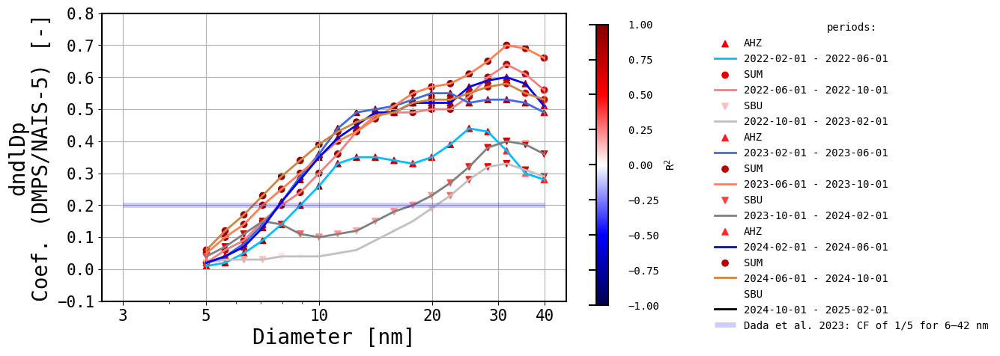

In [69]:
fig = plot_regression_dict(dict_df_coefs_start, var='dndlDp', top=.8, bottom=-0.1)